# import packages

In [ ]:
library(reticulate)
use_condaenv("mar25", required = TRUE)


In [4]:
library(Signac)
library(Seurat)
library(data.table)
library(ggplot2)
library(tidyverse)
library(readxl)
library(patchwork)
library(ComplexHeatmap)
library(patchwork)
library(ggpubr)
library(GenomicRanges) 
library(EnsDb.Mmusculus.v79)
library(DT)
library(future)
library(anndata)

plan("multicore", workers = 4)

options(future.globals.maxSize = 50000 * 1024^2) # for 50 Gb RAM

#base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/'
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/repos/niche/'
setwd(base_dir)


# import design table

In [5]:
design = fread(file = 'data/dsn_dt_base_v4.tsv')


In [6]:
ma9_msc_samples = c('M2', 'M3', 'M4', 'M4_m10', 'ctrl_m4w', 'ctrl_m6w', 'ctrl_m8w')

msc_design = design[sample_name %in% ma9_msc_samples,] 
msc_design


base_dir,sample_name,peak_file,h5file,sname,h5file_save,h5file_rna_save,h5file_atac_save,h5file_celltype_save,scrublet_rna,⋯,model,sample_type,time_point,peak_h5_file,metric_file,barcode_file,barcode_file2,sampleID2,sampleIDD,sample_name_short
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/,M2,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M2_out//outs/atac_peaks.bed,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M2_out//outs/filtered_feature_bc_matrix.h5,M2,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M2.h5mu,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M2_rna.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M2_atac.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M2_celltype.h5mu,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M2_rna_scrublet.csv,⋯,ma9,model,4,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M2_out//outs/filtered_feature_bc_matrix.h5,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M2_out//outs/per_barcode_metrics.csv,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang//data/M2_barcode_metrics.csv,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang//data/M2_atac_barcode_metrics.csv,MA9_MSC_wk4,MA9_MSC_wk4,M2
/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/,M3,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M3_out//outs/atac_peaks.bed,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M3_out//outs/filtered_feature_bc_matrix.h5,M3,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M3.h5mu,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M3_rna.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M3_atac.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M3_celltype.h5mu,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M3_rna_scrublet.csv,⋯,ma9,model,6,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M3_out//outs/filtered_feature_bc_matrix.h5,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M3_out//outs/per_barcode_metrics.csv,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang//data/M3_barcode_metrics.csv,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang//data/M3_atac_barcode_metrics.csv,MA9_MSC_wk6,MA9_MSC_wk6,M3
/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/,M4,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M4_out//outs/atac_peaks.bed,/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/M4_out//outs/filtered_feature_bc_matrix.h5,M4,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M4.h5mu,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M4_rna.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/data2/M4_atac.h5ad,/research_jude/rgs01_jude/groups/jxugrp/home/commo

In [63]:
atac_peak_list = lapply(msc_design$peak_file, function(fname){
    tmp = read.table(fname, col.names = c("chr", "start", "end"))
    makeGRangesFromDataFrame(tmp)
})

In [64]:
atac_peaks <- Signac::reduce(c(
    atac_peak_list[[1]], atac_peak_list[[2]], atac_peak_list[[3]], atac_peak_list[[4]],
    atac_peak_list[[5]], atac_peak_list[[6]], atac_peak_list[[7]]))


Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': JH584295.1
  - in 'y': GL456210.1, GL456221.1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


In [65]:
# Filter out bad peaks based on length
peakwidths <- width(atac_peaks)
atac_peaks <- atac_peaks[peakwidths  < 10000 & peakwidths > 20]
atac_peaks


GRanges object with 180869 ranges and 0 metadata columns:
             seqnames          ranges strand
                <Rle>       <IRanges>  <Rle>
       [1]       chr1 3020504-3021459      *
       [2]       chr1 3059262-3060154      *
       [3]       chr1 3147245-3148357      *
       [4]       chr1 3184532-3185386      *
       [5]       chr1 3311156-3312128      *
       ...        ...             ...    ...
  [180865] GL456221.1     78648-79576      *
  [180866] GL456221.1     80747-81086      *
  [180867] GL456221.1     86928-87954      *
  [180868] GL456221.1   128413-129257      *
  [180869] GL456221.1   140577-141450      *
  -------
  seqinfo: 30 sequences from an unspecified genome; no seqlengths

In [66]:
metrics_list = lapply(msc_design$metric_file, function(fname){
    tmp <- read.table(fname, stringsAsFactors = FALSE, sep = ",", header = TRUE, row.names = 1 )
    tmp[-1, ]
})

In [67]:
summary(metrics_list[[1]]$atac_raw_reads)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0       0       1     186       4 2529801 

In [68]:
dim(metrics_list[[1]][metrics_list[[1]]$atac_raw_reads > 1500, ])

[1] 3246   30

In [69]:
mtrics_filtered_list = lapply(metrics_list, function(tmp){tmp[tmp$atac_raw_reads > 1000, ]})

In [70]:
lapply(mtrics_filtered_list, nrow)

[[1]]
[1] 3789

[[2]]
[1] 10711

[[3]]
[1] 3290

[[4]]
[1] 6973

[[5]]
[1] 50816

[[6]]
[1] 7478

[[7]]
[1] 48031

In [71]:
msc_frag_list = lapply(1:length(mtrics_filtered_list), function(ii){ 
    fname = msc_design[ii, fragment_file]
    cells = mtrics_filtered_list[[ii]][, 'gex_barcode']
    CreateFragmentObject( path = fname, cells = cells) }
)

Computing hash

Computing hash

Computing hash

Computing hash

Computing hash

Computing hash

Computing hash



In [72]:
feature_counts_list = lapply(1:length(msc_frag_list), function(ii){
    frag  = msc_frag_list[[ii]]
    cells = mtrics_filtered_list[[ii]][, 'gex_barcode']
    FeatureMatrix( fragments = frag, features = atac_peaks, cells = cells)}  )

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions



In [73]:
atac_assay_list = lapply(1:length(feature_counts_list), function(ii){
    CreateChromatinAssay(feature_counts_list[[ii]], fragments = msc_frag_list[[ii]])
})

In [74]:
atac_oo_list = lapply(1:length(atac_assay_list), function(ii){
    oo = CreateSeuratObject(atac_assay_list[[ii]], assay = 'ATAC', meta.data = msc_frag_list[[ii]])
    oo$dataset = msc_design$sample_name
    oo
})

Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"
Warning message:
"[[<- defined for objects of type "S4" only for subclasses of environment"


In [75]:
msc_design$sampleID2 = sub('r2', '', msc_design$sampleID)

In [96]:
msc_design$sampleID2

[1] "MA9_MSC_wk4"  "MA9_MSC_wk6"  "MA9_MSC_wk8"  "MA9_MSC_wk8"  "Ctrl_MSC_wk4"
[6] "Ctrl_MSC_wk6" "Ctrl_MSC_wk8"

In [95]:
oo <- merge(
  x = atac_oo_list[[1]],
  y = atac_oo_list[2:length(atac_oo_list)],
  add.cell.ids = paste0(msc_design$sampleID2, '_')
)

Warning message:
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


In [94]:
oo[["ATAC"]]

ChromatinAssay data with 180869 features for 131088 cells
Variable features: 0 
Genome: 
Annotation present: FALSE 
Motifs present: FALSE 
Fragment files: 7 

# import scRNA-Seq results

In [458]:
# to get consistent clusters, an better version were exported from previous run
rna_seu_5 = readRDS('data/rna_seu_5_demo.rds')


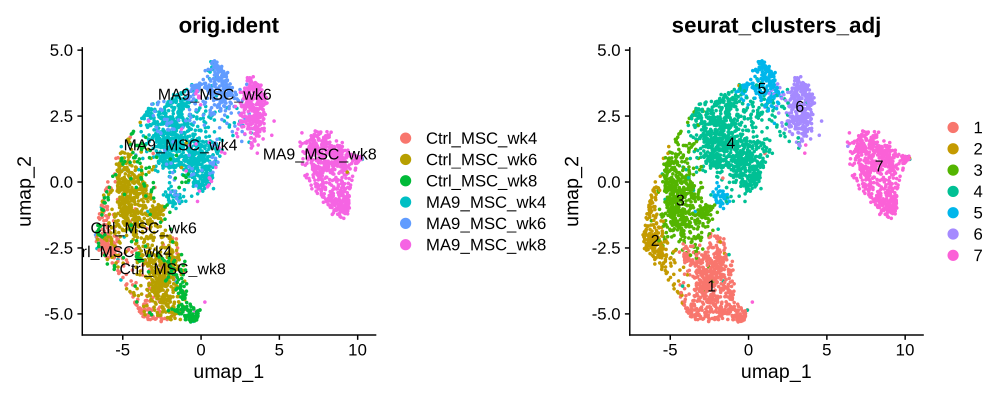

In [440]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
DimPlot(rna_seu_5, label = TRUE, group.by = c('orig.ident', 'seurat_clusters_adj'))

# import scATAC-Seq datasets


In [ ]:
oo_msc_5 = readRDS(file = 'data/oo_msc_5_w_info.rds')
oo_msc_5_peaks_dt = readRDS(file = 'data/oo_msc_5_peaks_dt.rds')
oo_msc_5_peaks = readRDS(file = 'data/oo_msc_5_peaks.rds')
oo_msc_5_peaks_4clusters = readRDS(file = 'data/oo_msc_5_peaks_4clusters.rds')

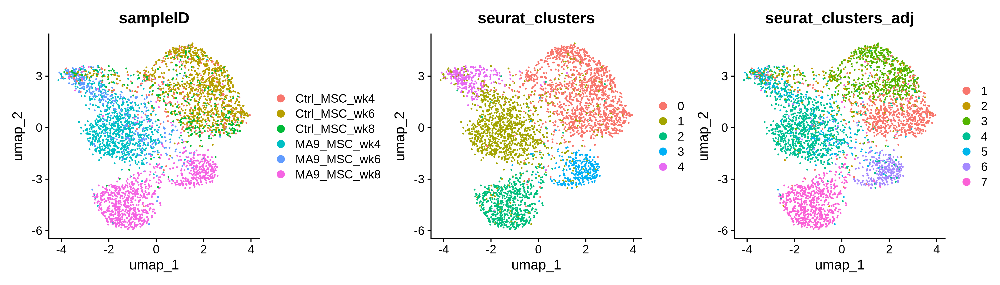

In [475]:
options(repr.plot.width = 14, repr.plot.height = 4, repr.plot.res = 300)
DimPlot(oo_msc_5, group.by = c('sampleID', 'seurat_clusters', 'seurat_clusters_adj'), pt.size = 0.1)
# sample ID, scATAC-Seq clusters, scRNA-Seq clusters

# call peaks and plot

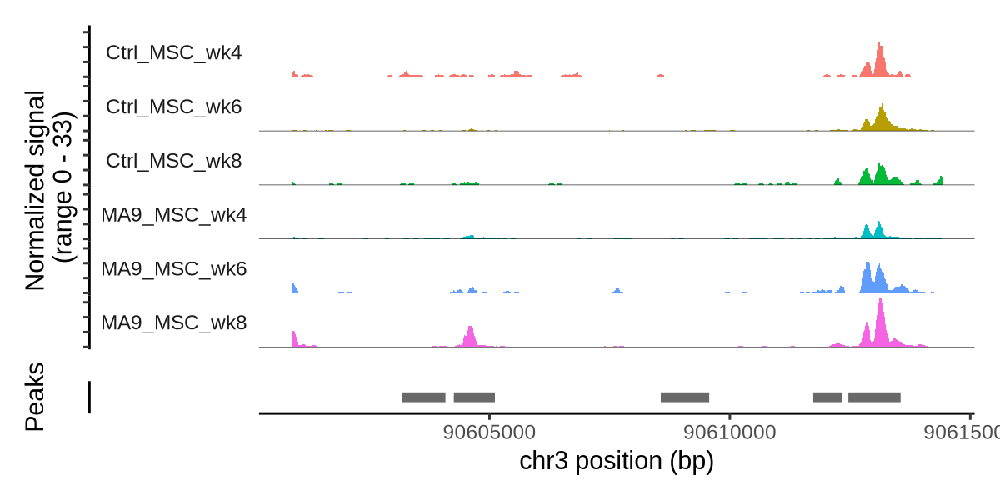

In [393]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
CoveragePlot(
  object = oo_msc_5,
  group.by = 'sampleID',
  region = "chr3-90600882-90614414"
)
# S100a6 chr3:90,612,882-90,614,414


Warning message:
"Removed 1 rows containing missing values (`geom_segment()`)."


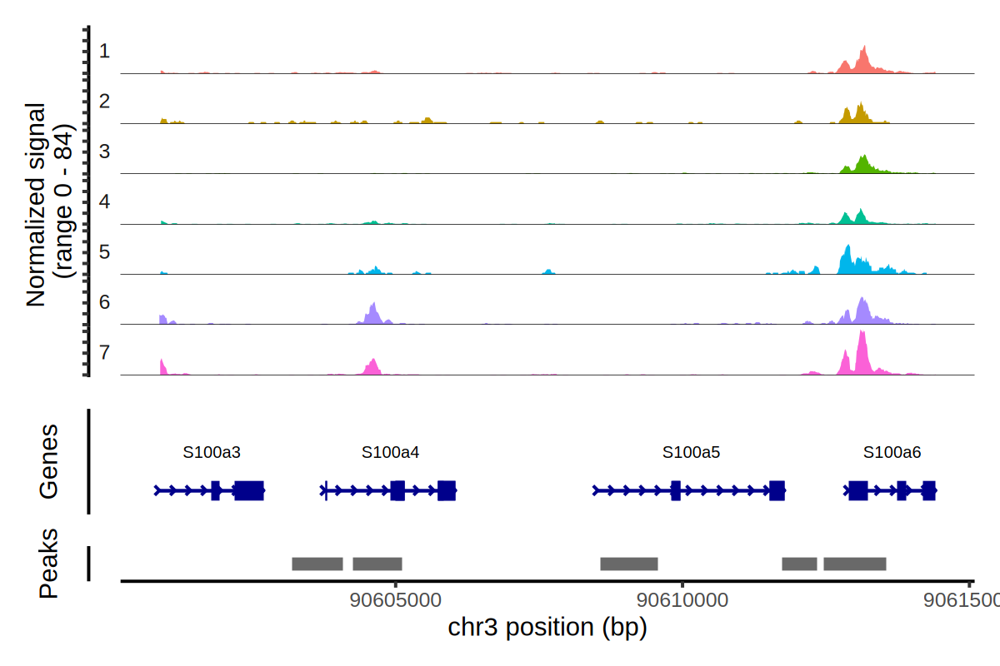

In [302]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
CoveragePlot(
  object = oo_msc_5,
  group.by = 'seurat_clusters_adj',
  region = "chr3-90600882-90614414"
)
# S100a6 chr3:90,612,882-90,614,414


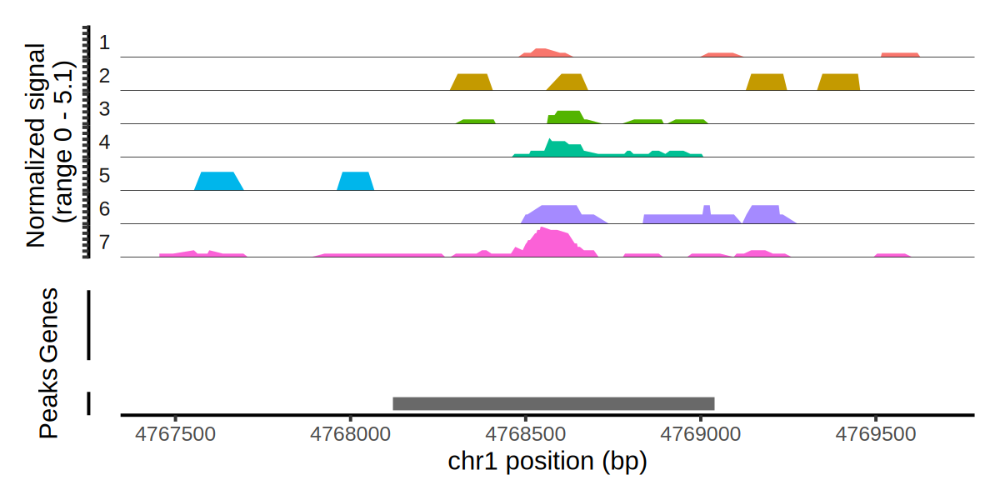

In [307]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
CoveragePlot(
  object = oo_msc_5,
  group.by = 'seurat_clusters_adj',
  region = "chr1-4767454-4769671"
)


In [310]:
oo_msc_5@assays$RNA2 = rna_seu_5@assays$RNA

Warning message:
"Removed 7 rows containing missing values (`geom_segment()`)."


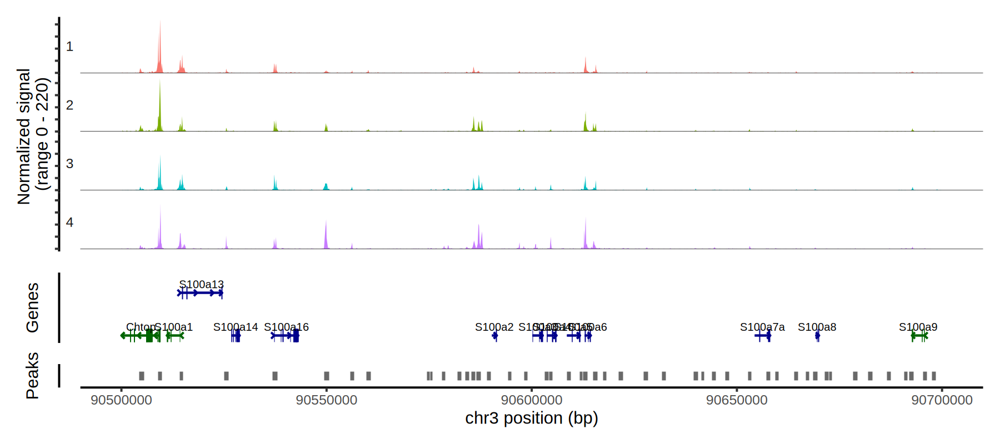

In [93]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plot.res = 200)
CoveragePlot(
  object = oo_msc_5,
  group.by = 'seurat_clusters_adj',
  region = "chr3-90500000-90700000"
)
# S100a6: chr3:90,612,882-90,614,414
# S100a8: chr3:90,668,978-90,670,035
# S100a9: chr3:90,692,632-90,695,721

# S100a6:  chr3:90,612,882-90,614,414
# S100a8: chr3:90,668,978-90,670,035
# S100a9:chr3:90,692,632-90,695,721

# chr3-90500000-90700000

# peak annotate & violin plot for gene expression

In [174]:
library(eulerr)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
library(ChIPseeker)


In [170]:
head(oo_msc_5_peaks)

GRanges object with 6 ranges and 1 metadata column:
      seqnames          ranges strand | peak_called_in
         <Rle>       <IRanges>  <Rle> |    <character>
  [1]     chr1 4426668-4427187      * |        1,2,3,4
  [2]     chr1 4571483-4571934      * |              4
  [3]     chr1 4768454-4768671      * |              7
  [4]     chr1 4785224-4785915      * |  1,2,3,4,5,6,7
  [5]     chr1 4807451-4808167      * |  1,2,3,4,5,6,7
  [6]     chr1 4857328-4858356      * |  1,2,3,4,5,6,7
  -------
  seqinfo: 25 sequences from an unspecified genome; no seqlengths

In [ ]:
ann = annotatePeak(oo_msc_5_peaks, TxDb = TxDb.Mmusculus.UCSC.mm10.knownGene, annoDb = 'org.Mm.eg.db')
ann_kl4 = annotatePeak(oo_msc_5_peaks_4clusters, TxDb = TxDb.Mmusculus.UCSC.mm10.knownGene, annoDb = 'org.Mm.eg.db')


In [321]:
options(width = 179)

In [323]:
ann

Annotated peaks generated by ChIPseeker
78809/78831  peaks were annotated
Genomic Annotation Summary:
              Feature  Frequency
9    Promoter (<=1kb) 23.3831161
10   Promoter (1-2kb)  3.7495717
11   Promoter (2-3kb)  2.9730107
4              5' UTR  0.1890647
3              3' UTR  1.8056313
1            1st Exon  1.5099798
7          Other Exon  2.8423150
2          1st Intron 11.2372952
8        Other Intron 21.7107183
6  Downstream (<=300)  0.1002424
5   Distal Intergenic 30.4990547

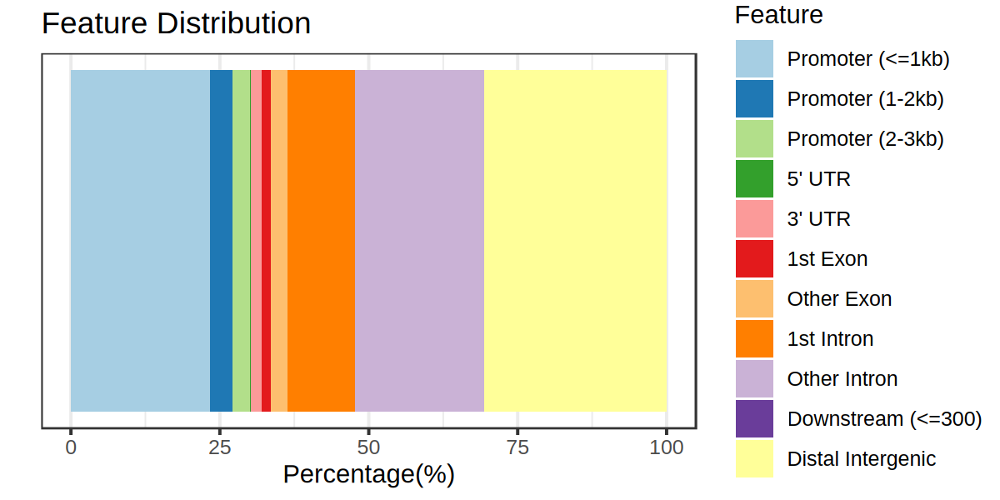

In [324]:
plotAnnoBar(ann)

[1] "Prelp"  "Lxn"    "Jun"    "Medag"  "Camk1"  "Dkk3"   "Angpt2" "Wipi1"  "Fos"    "Smagp"  "Fndc1"  "Adgrf5"

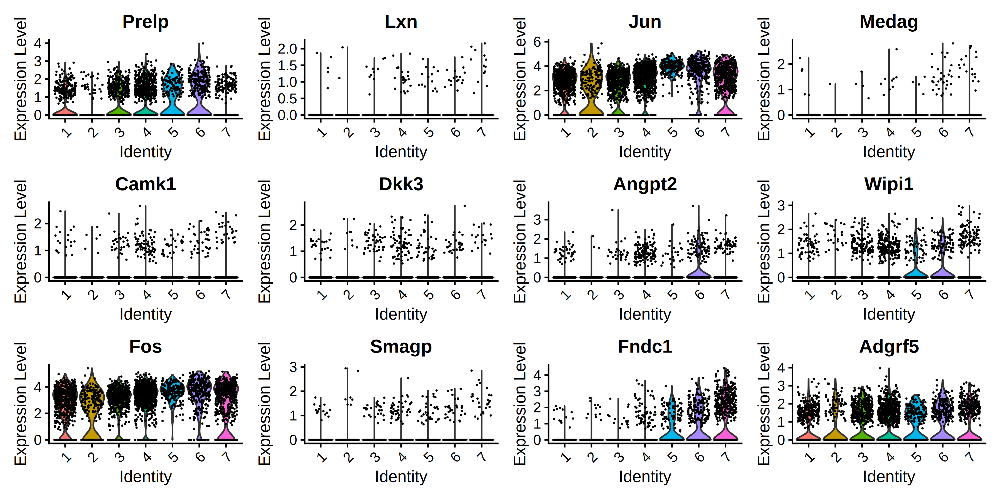

In [374]:
# display the gene expression difference of these genes with chromosome status changes
peak_dt = as.data.table(ann@anno)
peak_dt[, peak_called_in := paste(sort(unlist(strsplit(peak_called_in, ','))), collapse = ','), by = 1:nrow(peak_dt)]
plotdat = peak_dt[peak_called_in %in% c('6') & abs(distanceToTSS) < 5000, .(seqnames, start, end, peak_called_in, annotation, SYMBOL, GENENAME)]
feat_sel = intersect(plotdat$SYMBOL, rna_seu_5_markers[cluster == '6', gene])
feat_sel
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 300)
VlnPlot(object = rna_seu_5, features = feat_sel, ncol = 4, group.by = 'seurat_clusters_adj')


In [352]:
peak_dt_kl4 = as.data.table(ann_kl4@anno)
peak_dt_kl4[, peak_called_in := paste(sort(unlist(strsplit(peak_called_in, ','))), collapse = ','), by = 1:nrow(peak_dt_kl4)]


Warning message:
"Removed 2 rows containing missing values (`geom_segment()`)."


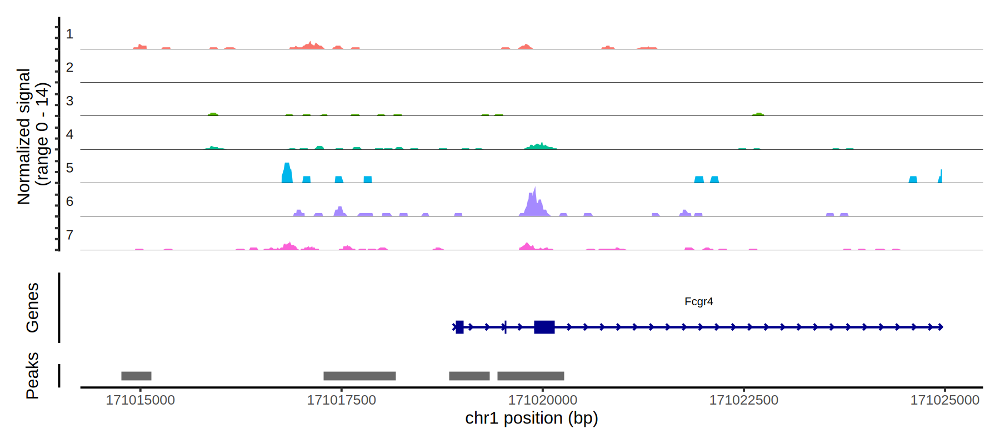

In [363]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plot.res = 200)
CoveragePlot(
    object = oo_msc_5,
    group.by = 'seurat_clusters_adj',
    region = "chr1-171019764-171019963",
    extend.upstream   = 5000,
    extend.downstream = 5000

)
#chr1	78195219	78195418	6	Promoter (1-2kb)	Pax3	paired box 3
#chr1	80710833	80711059	6	Promoter (1-2kb)	Dock10	dedicator of cytokinesis 10
#chr1	171019764	171019963	6	Promoter (<=1kb)	Fcgr4        	
# lrp1b

# gene expression of interested genes


Warning message:
"The following requested variables were not found: S100a7"


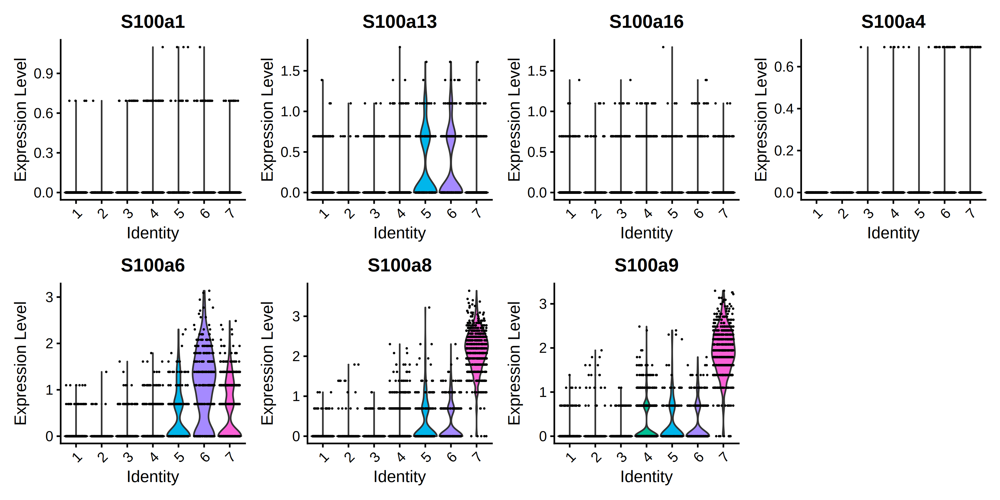

In [145]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 300)
#VlnPlot(object = rna_seu_5, features = c('S100a1', 'S100a13', 'S100a14', 'S100a16', 'S100a3', 'S100a4', 'S100a5', 'S100a6', 'S100a7', 'S100a8', 'S100a9'), ncol = 5)
VlnPlot(object = rna_seu_5, features = c('S100a1', 'S100a13', 'S100a16', 'S100a4', 'S100a6', 'S100a7', 'S100a8', 'S100a9'), ncol = 4, group.by = 'seurat_clusters_adj')


# FindAllMarkers

In [18]:
rna_seu_5$seurat_clusters_adj2 = rna_seu_5$seurat_clusters_adj
rna_seu_5$seurat_clusters_adj2[rna_seu_5$seurat_clusters_adj == 5 & rna_seu_5$umap2 < 1] = 4


In [22]:
Idents(rna_seu_5) = rna_seu_5$seurat_clusters_adj2

In [23]:
# saved var
rna_seu_5_markers = FindAllMarkers(rna_seu_5, only.pos = T)
rna_seu_5_markers = as.data.table(rna_seu_5_markers, keep.rownames = T)


Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



In [24]:
rna_seu_5_markers[gene == 'S100a6', ]

rn,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
S100a6,6.689445e-10,0.4767489,0.448,0.232,2.159687e-05,5,S100a6
S100a61,5.923576e-132,2.9831156,0.745,0.196,1.912426e-127,6,S100a6
S100a62,3.426336e-66,1.4720762,0.496,0.191,1.106192e-61,7,S100a6


In [ ]:
rna_seu_5_markers %>% group_by(cluster) %>% head(10)

In [155]:
feat_sel = unique(c(
    rna_seu_5_markers[cluster %in% c('1') ][order(p_val_adj), gene][1:5],
    rna_seu_5_markers[cluster %in% c('2') ][order(p_val_adj), gene][1:5],
    rna_seu_5_markers[cluster %in% c('3') ][order(p_val_adj), gene][1:5],
    rna_seu_5_markers[cluster %in% c('4') ][order(p_val_adj), gene][1:5],
    rna_seu_5_markers[cluster %in% c('5') ][order(p_val_adj), gene][1:5],
    rna_seu_5_markers[cluster %in% c('6') ][order(p_val_adj), gene][1:5],
    'S100a6',
    rna_seu_5_markers[cluster %in% c('7') ][order(p_val_adj), gene][1:50]) )
head(feat_sel)


[1] "Ifrd1"   "Ahnak"   "Nfkb1"   "Kdm6b"   "Gm42418" "Cmss1"

In [152]:
rna_seu_5_copy

An object of class Seurat 
48513 features across 3624 samples within 2 assays 
Active assay: SCT (16228 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [153]:
dim(rna_seu_5_copy@assays$RNA$scale.data)

[1]  100 3624

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


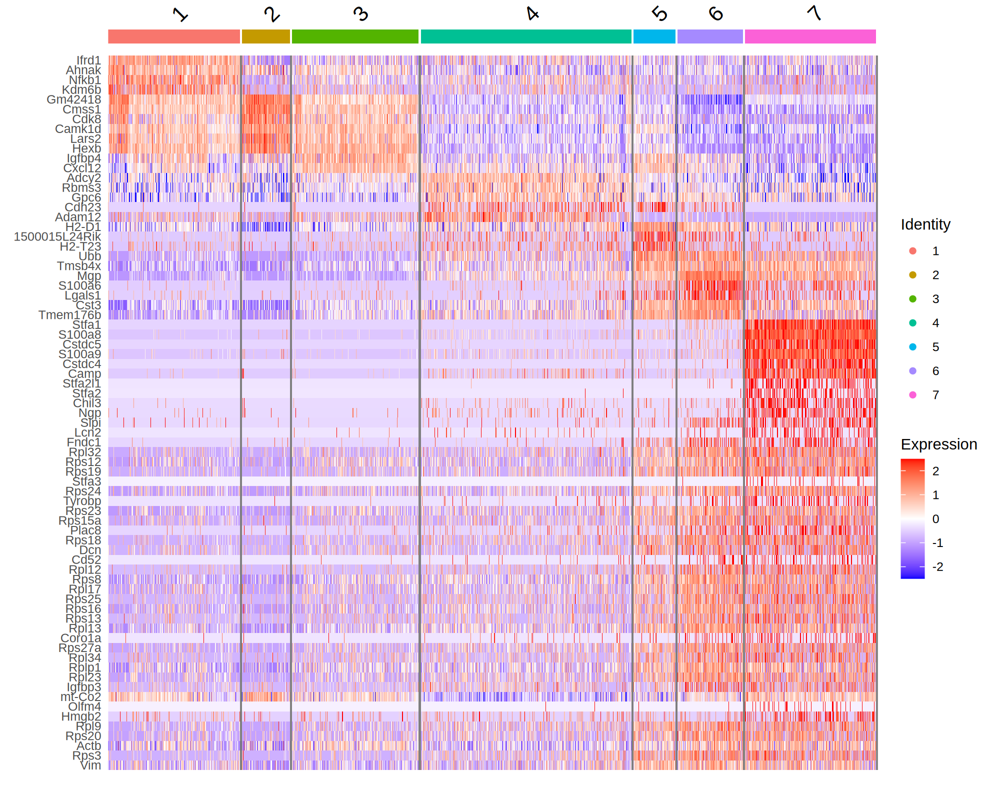

In [156]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 200)
rna_seu_5_copy = ScaleData(rna_seu_5, features = feat_sel , assay = 'RNA') 
ret = DoHeatmap(rna_seu_5_copy, features = feat_sel, group.by = 'seurat_clusters_adj', assay = 'RNA', slot = 'scale.data') + 
scale_fill_gradientn(colors = c("blue", "white", "red"))
ret


In [505]:
rna_seu_5_copy = copy(rna_seu_5)
Idents(rna_seu_5_copy) = rna_seu_5$kl
rna_seu_5_markers_kl34 = FindAllMarkers(rna_seu_5_copy, only.pos = T)
rna_seu_5_markers_kl34 = as.data.table(rna_seu_5_markers_kl34, keep.rownames = T)
head(rna_seu_5_markers_kl34)


Calculating cluster KL34

Calculating cluster KL12



rn,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Mgp,0.000000e+00,4.607917,0.908,0.389,0.000000e+00,KL34,Mgp
Ubb,3.218106e-252,2.744055,0.790,0.305,5.222343e-248,KL34,Ubb
Fth1,1.187185e-214,1.999045,0.869,0.551,1.926564e-210,KL34,Fth1
Tmsb4x,3.201667e-213,2.021945,0.882,0.612,5.195666e-209,KL34,Tmsb4x
S100a8,3.056277e-178,5.674094,0.478,0.039,4.959726e-174,KL34,S100a8
Cst3,6.840199e-176,1.758449,0.925,0.785,1.110027e-171,KL34,Cst3


# cell cycle scoring

In [176]:
# conclustion: no obvious cell cycle difference of these MSC clusters

In [48]:
geneId = as.data.table(read.csv('~/WenhuoHu/repos/niche/data/human_to_mouse.csv'))
setkey(geneId, 'Gene.name')
head(geneId)

Gene.stable.ID,Gene.name,Mouse.gene.name,Mouse.gene.stable.ID,Mouse.homology.type,Mouse.orthology.confidence..0.low..1.high.,Mouse.Gene.order.conservation.score
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>
ENSG00000278704,,,,,NA,NA
ENSG00000277630,,,,,NA,NA
ENSG00000276197,,,,,NA,NA
ENSG00000271254,,,,,NA,NA
ENSG00000278573,,,,,NA,NA
ENSG00000277400,,,,,NA,NA


In [49]:
m.s.genes = geneId[cc.genes$s.genes, Mouse.gene.name]
m.g2m.genes = geneId[cc.genes$g2m.genes, Mouse.gene.name]
 

In [50]:
m.s.genes = m.s.genes[!is.na(m.s.genes) ]
m.g2m.genes = m.g2m.genes[!is.na(m.g2m.genes) ]
m.s.genes = m.s.genes[m.s.genes != '' ]
m.g2m.genes = m.g2m.genes[m.g2m.genes != '' ]
m.s.genes
m.g2m.genes


[1] "Mcm5"     "Pcna"     "Tyms"     "Fen1"     "Mcm2"     "Mcm4"    
 [7] "Rrm1"     "Ung"      "Gins2"    "Mcm6"     "Cdca7"    "Dtl"     
[13] "Prim1"    "Uhrf1"    "Hells"    "Rfc2"     "Rpa2"     "Nasp"    
[19] "Rad51ap1" "Gmnn"     "Wdr76"    "Slbp"     "Ccne2"    "Ubr7"    
[25] "Msh2"     "Rad51"    "Rrm2"     "Cdc45"    "Cdc6"     "Exo1"    
[31] "Tipin"    "Dscc1"    "Blm"      "Casp8ap2" "Usp1"     "Clspn"   
[37] "Pola1"    "Chaf1b"   "Brip1"    "E2f8"

[1] "Hmgb2"   "Cdk1"    "Nusap1"  "Ube2c"   "Birc5"   "Tpx2"    "Top2a"  
 [8] "Ndc80"   "Cks2"    "Nuf2"    "Cks1b"   "Mki67"   "Tmpo"    "Cenpf"  
[15] "Tacc3"   "Smc4"    "Ccnb2"   "Ckap2l"  "Ckap2"   "Aurkb"   "Bub1"   
[22] "Kif11"   "Anp32e"  "Tubb4b"  "Gtse1"   "Kif20b"  "Hjurp"   "Cdca3"  
[29] "Cdc20"   "Ttk"     "Cdc25c"  "Kif2c"   "Rangap1" "Ncapd2"  "Dlgap5" 
[36] "Cdca2"   "Cdca8"   "Ect2"    "Kif23"   "Hmmr"    "Aurka"   "Psrc1"  
[43] "Anln"    "Lbr"     "Ckap5"   "Cenpe"   "Ctcf"    "Nek2"    "G2e3"   
[50] "Gas2l3"  "Cbx5"    "Cenpa"

In [52]:
DefaultAssay(rna_seu_5) = 'RNA'


In [53]:
rna_seu_5 <- CellCycleScoring(rna_seu_5, s.features = m.s.genes, g2m.features = m.g2m.genes, set.ident = TRUE, group.by = 'seurat_clusters_adj')

# view cell cycle scores and phase assignments
head(rna_seu_5@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,umap1,umap2,RNA_snn_res.0.2,seurat_clusters,RNA_snn_res.0.3,seurat_clusters_adj,nCount_SCT,nFeature_SCT,SCT_snn_res.0.7,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<dbl>,<int>,<fct>,<dbl>,<dbl>,<chr>,<fct>
MA9_MSC_wk4__AAACAGCCAGTCTATG-1_1,MA9_MSC_wk4,4002,1952,0.2899190,2.2399083,0,0,0,4,3560,1922,0,0.005961802,0.05859088,G2M,0
MA9_MSC_wk4__AAACATGCAGGTTAAA-1_1,MA9_MSC_wk4,5601,2425,-0.8321799,2.2082496,0,0,0,4,3787,2323,0,-0.002339210,-0.06003646,G1,0
MA9_MSC_wk4__AAACCAACACGCAACT-1_1,MA9_MSC_wk4,3650,1838,-2.5595048,1.3788477,0,0,0,4,3479,1818,0,0.056970074,-0.04475484,S,0
MA9_MSC_wk4__AAACCGAAGGGCTAAA-1_1,MA9_MSC_wk4,3377,1412,0.2238706,-0.2428197,0,0,0,4,3310,1402,0,-0.024618456,-0.03064294,G1,0
MA9_MSC_wk4__AAACCGGCAGTCTATG-1_1,MA9_MSC_wk4,2444,1426,-3.3178202,2.1340764,0,0,0,4,2767,1413,0,0.008576143,-0.05712161,S,0
MA9_MSC_wk4__AAAGCACCAGTAGCCT-1_1,MA9_MSC_wk4,4689,1796,-1.7963834,1.0186013,0,0,0,4,3578,1754,0,0.049085037,0.01123567,S,0


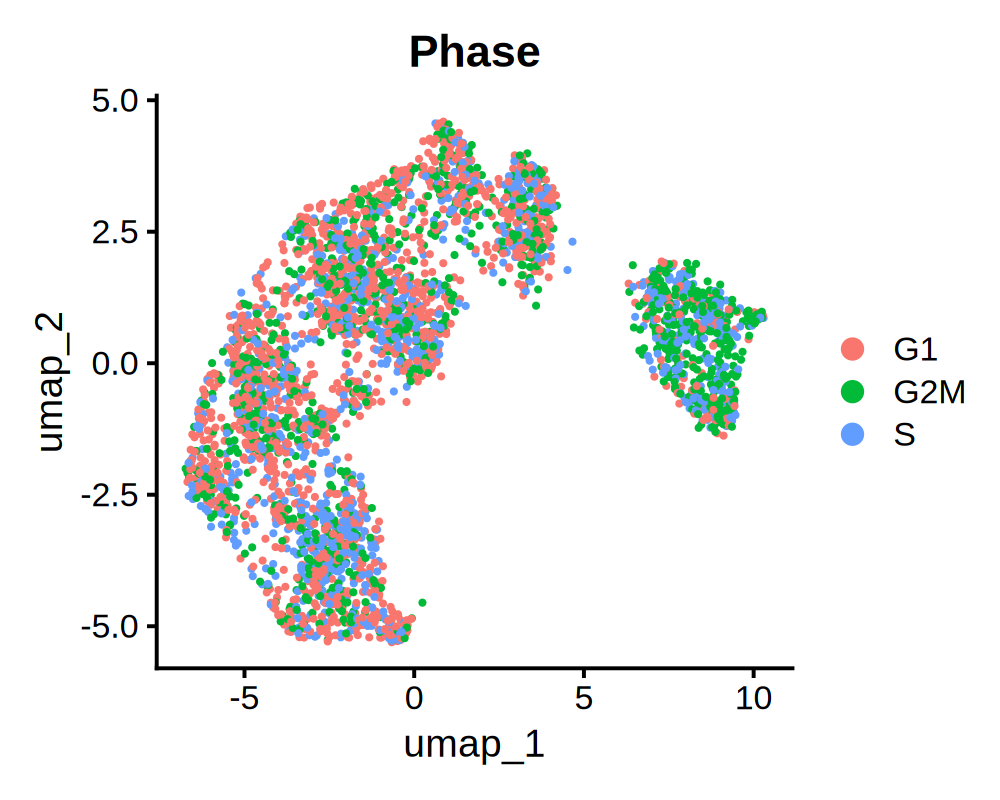

In [280]:
DimPlot(rna_seu_5, group.by = 'Phase')

Phase,V2,N,cluster_nn,percentage
<chr>,<chr>,<int>,<int>,<dbl>
G1,1,276,633,0.4360190
G2M,1,143,633,0.2259084
S,1,214,633,0.3380727
G1,2,111,230,0.4826087
G2M,2,61,230,0.2652174
S,2,58,230,0.2521739


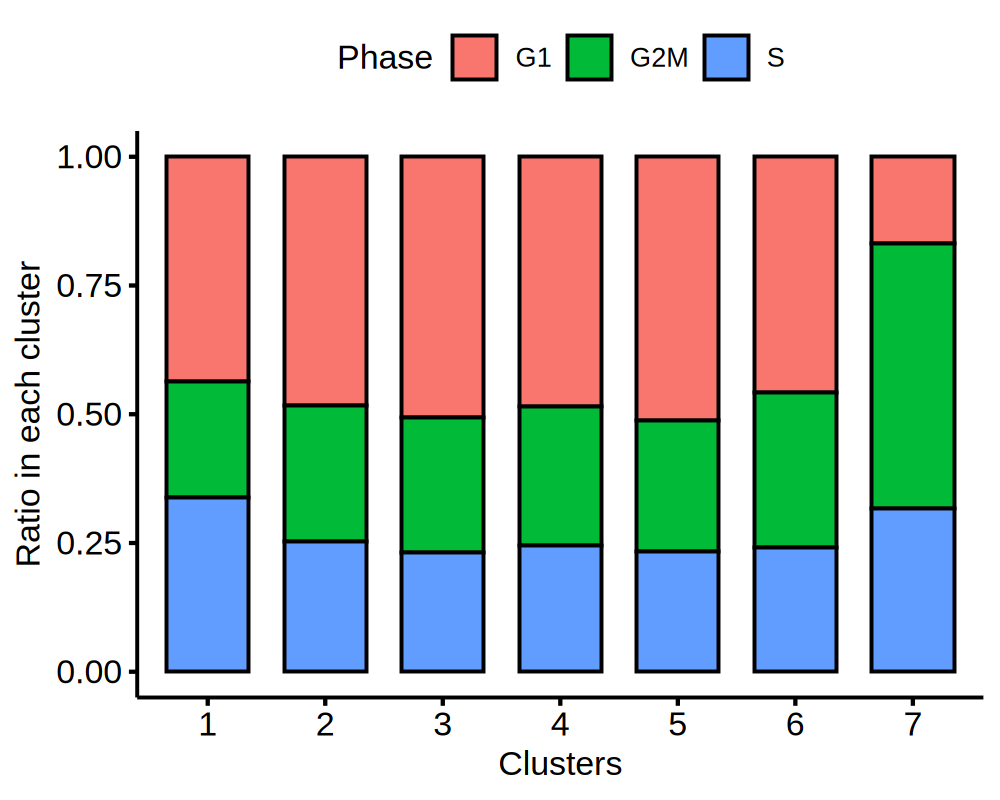

In [287]:
plotdat = as.data.table(rna_seu_5@meta.data)
plotdat = as.data.table(table(plotdat$Phase, plotdat$seurat_clusters_adj)) 
plotdat[, cluster_nn := sum(.SD$N), by = 'V2']
plotdat[, percentage := N / cluster_nn ]
setnames(plotdat, 'V1', 'Phase')
head(plotdat)
ggbarplot(plotdat, x = 'V2', y = 'percentage', fill = 'Phase') + xlab('Clusters') + ylab('Ratio in each cluster')


# genes related with osteoblast cell functions

## marker genes

In [546]:
# Markers for each population as per Scadden et al.
marker_MSC = c("Lepr", "Adipoq", "Cxcl12", "Kitl", "Grem1", "Vcam1")
marker_OLC = c("Bglap", "Runx2", "Sp7", "Cd200", "Spp1", "Grem1", "Mmp13")
marker_Chondro = c("Sox9", "Acan", "Col2a1", "Ihh", "Pth1r", "Mef2c")
marker_Pericyte = c("Acta2", "Nes", "Cspg4", "Myh11", "Mcam")
marker_EC = c("Pecam1", "Cdh5", "Cd34", "Kdr", "Emcn", "Flt4", "Ly6a")
marker_Fibro = c("Fn1", "S100a4", "Dcn", "Sema3c", "Cd34", "Ly6a", "Pdgfra", "Thy1", "Cd44", "Sox9", "Scx", "Spp1", "Nt5e", "Cspg4", "Cilp")
marker_LeprMSC = c("Lepr", "Adipoq", "Cxcl12", "Kitl", "Grem1", "Vcam1")
marker_OLC1 = c("Bglap", "Runx2", "Sp7", "Cxcl12 high", "Cd200", "Spp1")
marker_OLC2 = c("Bglap", "Runx2", "Sp7", "Cxcl12", "Grem1", "Mmp13")
marker_Chondrohyper = c("Sox9", "Acan", "Col10a1", "Ihh", "Runx2", "Mef2c")
marker_Chondroprogen = c("Sox9", "Acan", "Col2a1", "Grem1", "Runx2", "Sp7", "Alpl", "Spp1")
marker_Chondro = c("Sox9", "Acan", "Col2a1")
marker_Chondroprehyper2 = c("Sox9", "Acan", "Col2a1", "Ihh", "Pth1r", "Mef2c")
marker_ChondroprolRest = c("Sox9", "Acan", "Col2a1")
marker_Pericytes = c("Acta2", "Nes", "Cspg4", "Myh11", "Mcam")
marker_ECsinusoidal = c("Flt4", "Ly6a", "Cd34", "Il6st")
marker_ECarteriolar = c("Flt4", "Ly6a", "Cd34", "Il6st")
marker_ECarterial = c("Flt4", "Ly6a", "Cd34", "Il6st", "Kitl")
marker_Fibro = c("Fn1", "S100a4", "Dcn", "Sema3c", "Cd34", "Ly6a", "Pdgfra",  "Thy1", "Cd44", "Sox9", "Scx", "Spp1", "Nt5e", "Cspg4", "Cilp")
marker_LeprMSC = c("Lepr", "Adipoq", "Cxcl12", "Kitl", "Grem1", "Vcam1")

In [243]:
all_markers = unique(c("Lepr", "Adipoq", "Cxcl12", "Kitl", "Grem1", "Vcam1", "Bglap", "Runx2", "Sp7", "Cd200", "Spp1", "Grem1", "Mmp13", "Sox9", "Acan", "Col2a1", "Ihh", "Pth1r", "Mef2c", "Acta2", "Nes", "Cspg4", "Myh11", "Mcam",
  "Pecam1", "Cdh5", "Cd34", "Kdr", "Emcn", "Flt4", "Ly6a", "Lepr", "Adipoq", "Cxcl12", "Kitl", "Grem1", "Vcam1", "Bglap", "Runx2", "Sp7", "Cxcl12", "Cd200", "Spp1",
  "Bglap", "Runx2", "Sp7", "Cxcl12", "Grem1", "Mmp13", "Sox9", "Acan", "Col10a1", "Ihh", "Runx2", "Mef2c", "Sox9", "Acan", "Col2a1", "Grem1", "Runx2", "Sp7", "Alpl", "Spp1",
  "Sox9", "Acan", "Col2a1", "Sox9", "Acan", "Col2a1", "Ihh", "Pth1r", "Mef2c", "Sox9", "Acan", "Col2a1",
  "Acta2", "Nes", "Cspg4", "Myh11", "Mcam", "Flt4", "Ly6a", "Cd34", "Il6st", "Flt4", "Ly6a", "Cd34", "Il6st",
  "Flt4", "Ly6a", "Cd34", "Il6st", "Kitl", "Fn1", "S100a4", "Dcn", "Sema3c", "Cd34", "Ly6a", "Pdgfra",  "Thy1", "Cd44", "Sox9", "Scx", "Spp1", "Nt5e", "Cspg4", "Cilp",
  "Fn1", "S100a4", "Dcn", "Sema3c", "Cd34", "Ly6a", "Pdgfra", "Thy1", "Cd44", "Sox9", "Scx", "Spp1", "Nt5e", "Cspg4", "Cilp"))


In [244]:
# add interested gene 
all_markers = c(all_markers, 'S100a6', 'S100a8', 'S100a9')


Centering and scaling data matrix

Warning message in DoHeatmap(rna_seu_5_copy, features = feat_sel, group.by = "seurat_clusters_adj", :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: LAT2"
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


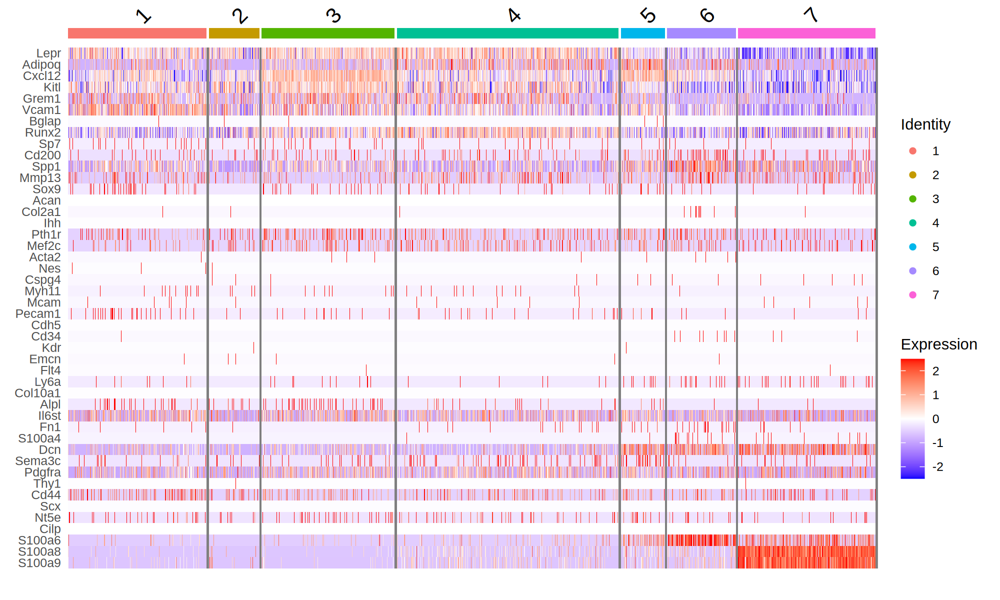

In [292]:
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 200)
feat_sel = all_markers
feat_sel = c(feat_sel, 'LAT2')
rna_seu_5_copy = ScaleData(rna_seu_5, features = feat_sel, assay = 'RNA') 
ret = DoHeatmap(rna_seu_5_copy, features = feat_sel, group.by = 'seurat_clusters_adj', assay = 'RNA', slot = 'scale.data') + 
scale_fill_gradientn(colors = c("blue", "white", "red"))
ret


Warning message:
"The following requested variables were not found: LAT2"


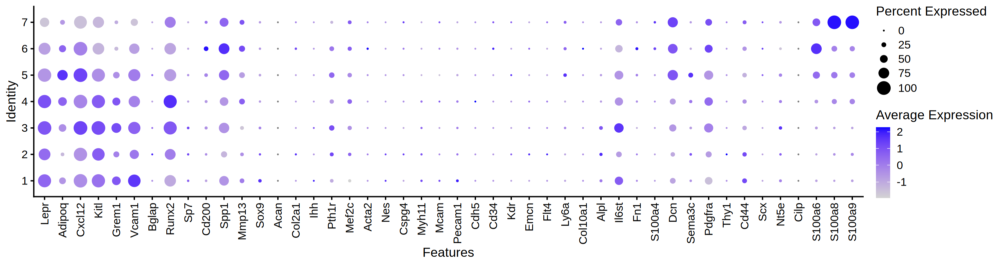

In [293]:
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 200)
DotPlot(rna_seu_5_copy, features = feat_sel, group.by = 'seurat_clusters_adj') + 
theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = .5))

In [ ]:
# '~/Copy of Sabatini Metabolic Gene List (Human and Mouse).xlsx'
# meta = as.data.table(read_excel('~/Mammalian_Metabolic_Final.xlsx'))
# https://esbl.nhlbi.nih.gov/Databases/KSBP2/Targets/Lists/MetabolicEnzymes/MetabolicEnzymeDatabase.html

In [178]:
meta = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/repos/niche/data/Mouse_metab_genes.txt')

In [427]:
head(rna_seu_5_markers[gene %in% meta$Symbol, ])
table(rna_seu_5_markers[gene %in% meta$Symbol, cluster])


rn,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Hmox1,9.171578e-112,2.884671,0.390,0.069,1.488364e-107,1,Hmox1
Hexb,1.366464e-105,0.921778,0.991,0.712,2.217497e-101,1,Hexb
Gls,1.363416e-66,1.203527,0.850,0.611,2.212551e-62,1,Gls
Chka,8.589742e-66,1.616351,0.624,0.304,1.393943e-61,1,Chka
Uap1,1.691001e-65,1.555421,0.583,0.260,2.744157e-61,1,Uap1
Man1a,3.327482e-57,1.461919,0.837,0.641,5.399837e-53,1,Man1a



  1   2   3   4   5   6   7 
158   6 372 314 400 382  66 

# monocle3 trajectory analysis 

In [20]:
library(monocle3)
library(SeuratWrappers)


In [46]:
GM_state <- function(cds){
  if (length(unique(pData(cds)$State)) > 1){
    T0_counts <- table(pData(cds)$State, pData(cds)$Hours)[,"0"]
    return(as.numeric(names(T0_counts)[which
          (T0_counts == max(T0_counts))]))
  } else {
    return (1)
  }
}


In [51]:
rna_seu_5

An object of class Seurat 
48513 features across 3624 samples within 2 assays 
Active assay: RNA (32285 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: SCT
 2 dimensional reductions calculated: pca, umap

In [21]:
cds <- as.cell_data_set(rna_seu_5, )
#cds <- preprocess_cds(cds, num_dim = 50)
#cds <- reduce_dimension(cds)
cds <- cluster_cells(cds, resolution=1e-3)

p1 <- plot_cells(cds, color_cells_by = "cluster", show_trajectory_graph = FALSE) #, root_state =)
p2 <- plot_cells(cds, color_cells_by = "partition", show_trajectory_graph = FALSE)


Warning message:
"Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object"


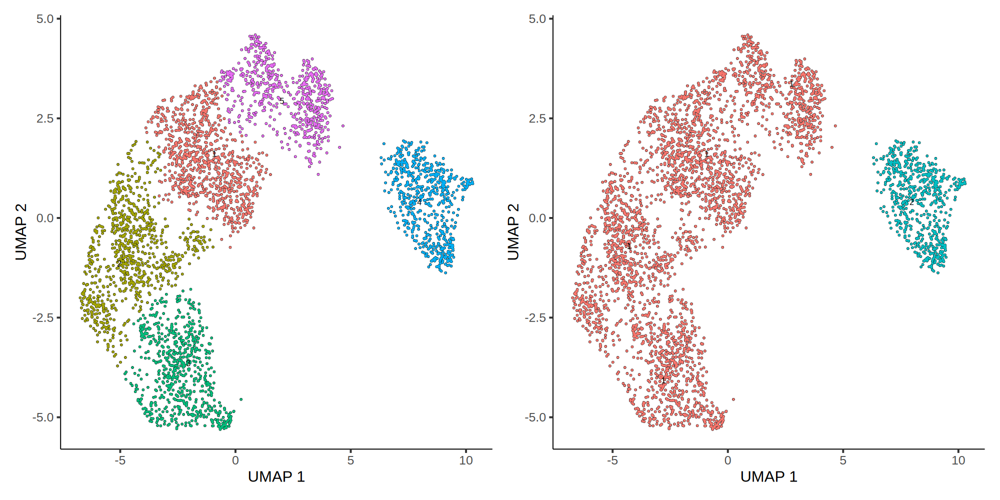

In [22]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 200)
wrap_plots(p1, p2)


In [24]:
rowData(cds) = data.frame(gene_short_name = rownames(cds) )


In [25]:
cds <- learn_graph(cds, use_partition = F, verbose = FALSE)


  |======================================================================| 100%


In [27]:
saveRDS(cds, file = 'data/msc_monocle3.rds')

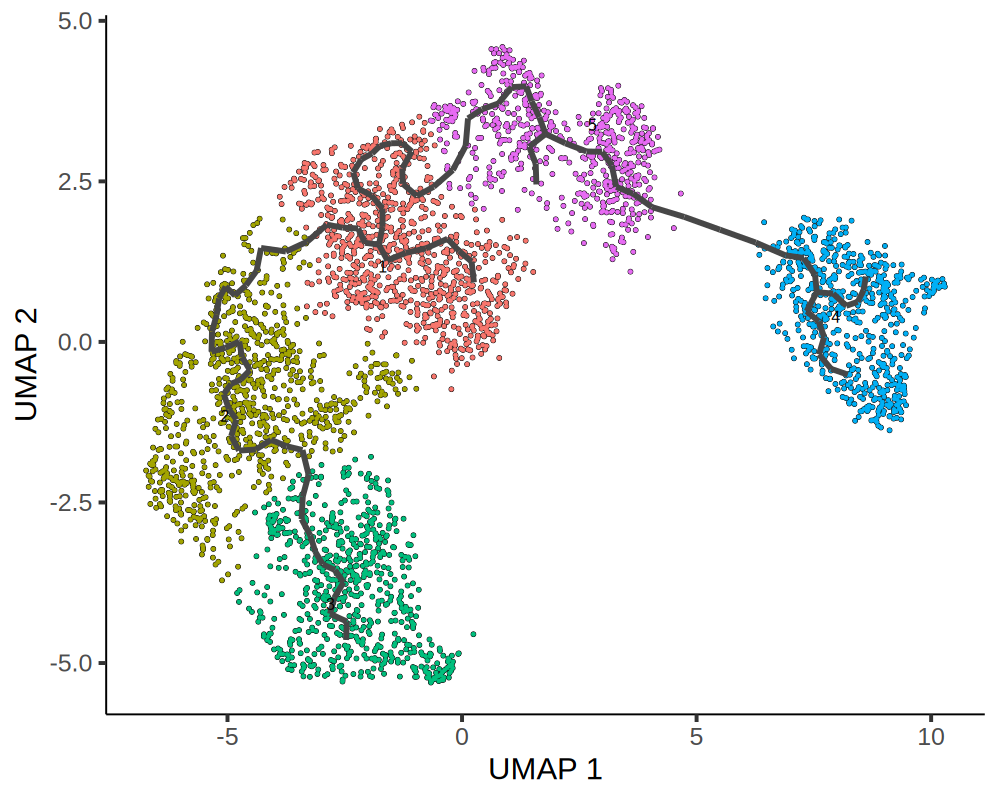

In [28]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
plot_cells(cds, color_cells_by = "cluster", label_groups_by_cluster=FALSE, label_leaves=FALSE, label_branch_points=FALSE)


In [29]:
# saved var
cds <- order_cells(cds, root_cells = colnames(cds[,cds$seurat_clusters_adj == 1]))


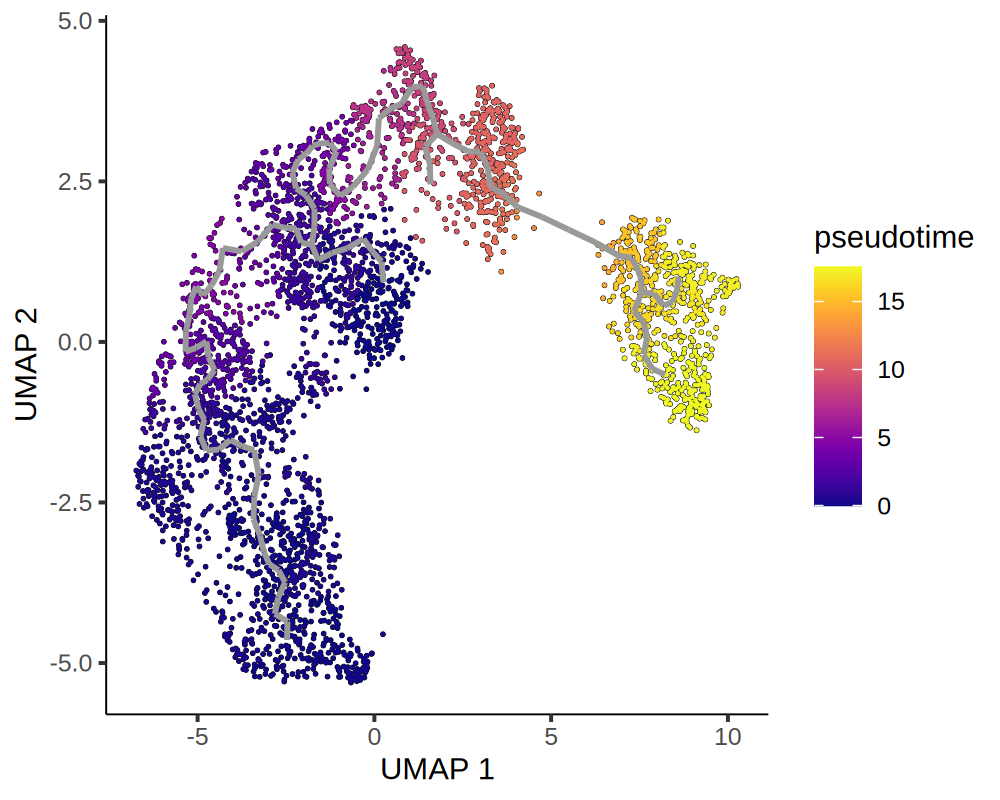

In [91]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
plot_cells(cds, 
           color_cells_by = "pseudotime",
           group_cells_by = "cluster",
           label_cell_groups = FALSE,
           label_groups_by_cluster=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE,
           label_roots = F,
           trajectory_graph_color = "grey60")


# motif analysis

In [ ]:
#library(JASPAR2020)
library(BSgenome.Mmusculus.UCSC.mm10)


In [175]:
library(Signac)
library(Seurat)
#library(TFBSTools)

In [ ]:
# Get a list of motif position frequency matrices from the JASPAR database
pfm <- getMatrixSet(
  x = JASPAR2020,
  opts = list(collection = "CORE", tax_group = 'vertebrates', all_versions = FALSE)
)


In [47]:
pfm = readRDS('data/pfm.rds')


In [ ]:
# add motif information
oo_msc_5 <- AddMotifs(
  object = oo_msc_5,
  genome = BSgenome.Mmusculus.UCSC.mm10,
  pfm = pfm
)


In [48]:
# saved var
oo_msc_5 = FRiP(oo_msc_5, assay = 'ATAC', total.fragments = 'fragments')


Calculating fraction of reads in peaks per cell



In [6]:
Idents(oo_msc_5) = oo_msc_5$seurat_clusters_adj


In [9]:
da_peaks <- FindMarkers( object = oo_msc_5, ident.1 = '6',  ident.2 = c('1', '2', '3', '4'),  only.pos = TRUE, test.use = 'LR', min.pct = 0.05, latent.vars = 'nCount_ATAC' )
da_peaks <- rownames(da_peaks[da_peaks$p_val < 0.005 & da_peaks$pct.1 > 0.2, ])
enriched_motifs  <- FindMotifs( object = oo_msc_5, features = da_peaks )


Selecting background regions to match input sequence characteristics

Matching GC.percent distribution

Testing motif enrichment in 1126 regions



In [10]:
head(enriched_motifs)


,motif,observed,background,percent.observed,percent.background,fold.enrichment,pvalue,motif.name,p.adjust
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
MA0478.1,MA0478.1,372,5471,33.03730,13.6775,2.415449,9.635380e-64,FOSL2,7.187994e-61
MA1622.1,MA1622.1,397,6258,35.25755,15.6450,2.253599,1.513416e-60,Smad2::Smad3,5.645043e-58
MA1141.1,MA1141.1,355,5480,31.52753,13.7000,2.301280,4.486926e-55,FOS::JUND,1.115749e-52
MA0476.1,MA0476.1,348,5559,30.90586,13.8975,2.223843,2.764876e-50,FOS,5.156493e-48
MA1135.1,MA1135.1,302,4484,26.82060,11.2100,2.392561,4.353688e-49,FOSB::JUNB,6.495702e-47
MA0099.3,MA0099.3,306,4648,27.17584,11.6200,2.338713,9.273544e-48,FOS::JUN,1.153011e-45


In [16]:
mm = intersect(toupper(unlist(unname(rna_seu_5_markers[cluster == '4', 'gene']))), enriched_motifs[enriched_motifs$p.adjust < 0.05, 'motif.name'])
mm_hsa = c('CEBPD', 'CEBPE', 'STAT3', 'JUND', 'KLF5', 'FOSL1')
mm_mmu = c('Cebpd', 'Cebpe', 'Stat3', 'Jund', 'Klf5', 'Fosl1')
mm_mmu_2 = c('Cebpa', 'Cebpb', 'Cebpd', 'Cebpe', 'Stat3', 'Jund', 'Klf5', 'Fosl1')

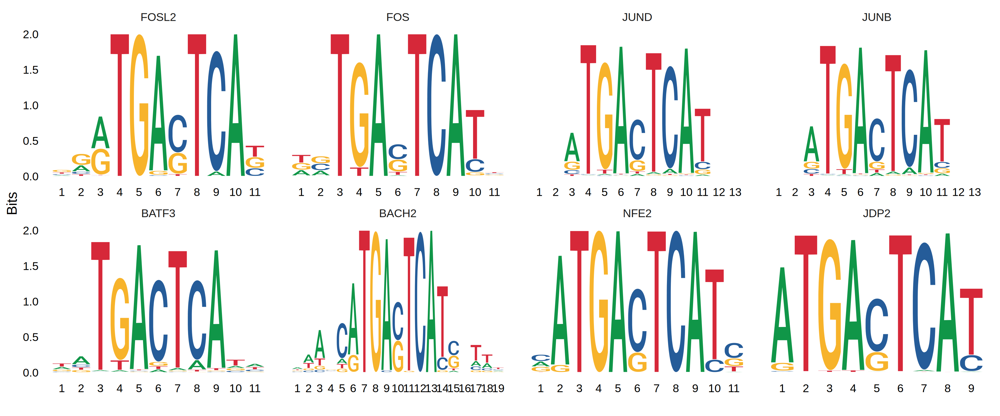

In [29]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 300)
motif_sel = c('FOSL2', 'FOS', 'JUND', 'JUNB', 'BATF3', 'BACH2', 'NFE2', 'JDP2')
MotifPlot( object = oo_msc_5, motifs = toupper(motif_sel), ncol = 4)


# pathway analysis 

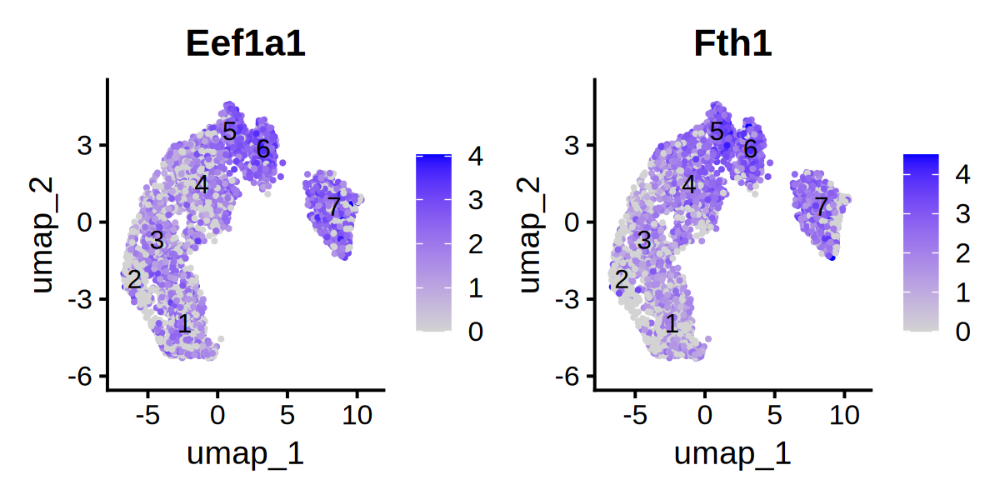

In [178]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
FeaturePlot(rna_seu_5, features = c('Eef1a1', 'Fth1'), label = TRUE) 


In [34]:
library(enrichR)
dbname = as.data.table(listEnrichrDbs())
dbname[grep('reactome', libraryName, ignore.case = T), ]


geneCoverage,genesPerTerm,libraryName,link,numTerms,appyter,categoryId
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>
3185,73,Reactome_2013,http://www.reactome.org/download/index.html,78,b343994a1b68483b0122b08650201c9b313d5c66,7
6768,47,Reactome_2015,http://www.reactome.org/download/index.html,1389,36e541bee015eddb8d53827579549e30fe7a3286,7
8973,64,Reactome_2016,http://www.reactome.org/download/index.html,1530,1f54638e8f45075fb79489f0e0ef906594cb0678,7
10489,61,Reactome_2022,https://reactome.org/download-data,1818,,2


In [37]:
rna_seu_5@active.ident = rna_seu_5$seurat_clusters_adj

In [71]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 300)
path_list = DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('1', '2', '3', '4', '5'), balanced = F, return.gene.list = T, p.val.cutoff = 0.05, enrich.database = "HMDB_Metabolites", max.genes = 250, num.pathway = 20)
path_list = as.data.table(path_list$pos)
path_list = path_list[HMDB_Metabolites.Adjusted.P.value < 0.05, ]
path_list


Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


In [70]:
path_list = as.data.table(path_list$pos)
path_list = path_list[HMDB_Metabolites.Adjusted.P.value < 0.05, ]
path_list

HMDB_Metabolites.Term,HMDB_Metabolites.Overlap,HMDB_Metabolites.P.value,HMDB_Metabolites.Adjusted.P.value,HMDB_Metabolites.Old.P.value,HMDB_Metabolites.Old.Adjusted.P.value,HMDB_Metabolites.Odds.Ratio,HMDB_Metabolites.Combined.Score,HMDB_Metabolites.Genes,log10pval,term
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
QH2 (HMDB01304),9/58,4.028905e-08,1.016101e-06,0,0,15.014735,255.65868,NDUFA13;NDUFA7;NDUFA6;NDUFS7;UQCRB;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2,7.394813,QH2 (HMDB01304)
Coenzyme Q (HMDB06709),9/59,4.702716e-08,1.016101e-06,0,0,14.713693,248.25738,NDUFA13;NDUFA7;NDUFA6;NDUFS7;UQCRB;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2,7.327651,Coenzyme Q (HMDB06709)
Ubiquinone Q1 (HMDB02012),9/61,6.350629e-08,1.016101e-06,0,0,14.146345,234.43503,NDUFA13;NDUFA7;NDUFA6;NDUFS7;UQCRB;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2,7.197183,Ubiquinone Q1 (HMDB02012)
Sulfide (HMDB00598),8/53,2.906152e-07,3.487382e-06,0,0,14.475666,217.87709,NDUFA13;NDUFA7;NDUFA6;NDUFS7;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2,6.536682,Sulfide (HMDB00598)
Oxygen (HMDB01377),9/148,1.045813e-04,1.003981e-03,0,0,5.268784,48.29128,COX8A;LOX;FTH1;COX4I1;COX7A2;COX6A1;COX6C;COX7C;COX6B1,3.980546,Oxygen (HMDB01377)
NADH (HMDB01487),10/204,2.573999e-04,2.059199e-03,0,0,4.200172,34.71391,LDHA;NDUFA13;NDUFA7;NDUFA6;NDUFS7;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2;GAPDH,3.589392,NADH (HMDB01487)
Iron (HMDB00692),9/193,7.452613e-04,5.110363e-03,0,0,3.971090,28.59890,NDUFA13;NDUFA7;NDUFA6;NDUFS7;NDUFB11;NDUFA4;FTH1;NDUFA2;NDUFA4L2,3.127691,Iron (HMDB00692)
NAD (HMDB00902),10/246,1.104510e-03,6.627057e-03,0,0,3.445268,23.45661,LDHA;NDUFA13;NDUFA7;NDUFA6;NDUFS7;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2;GAPDH,2.956831,NAD (HMDB00902)
FAD (HMDB01248),8/169,1.322260e-03,7.052051e-03,0,0,4.022175,26.66064,NDUFA13;NDUFA7;NDUFA6;NDUFS7;NDUFB11;NDUFA4;NDUFA2;NDUFA4L2,2.878683,FAD (HMDB01248)


Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


Warning message:
"Removed 7 rows containing missing values (`position_stack()`)."
Warning message:
"Removed 7 rows containing missing values (`geom_text()`)."


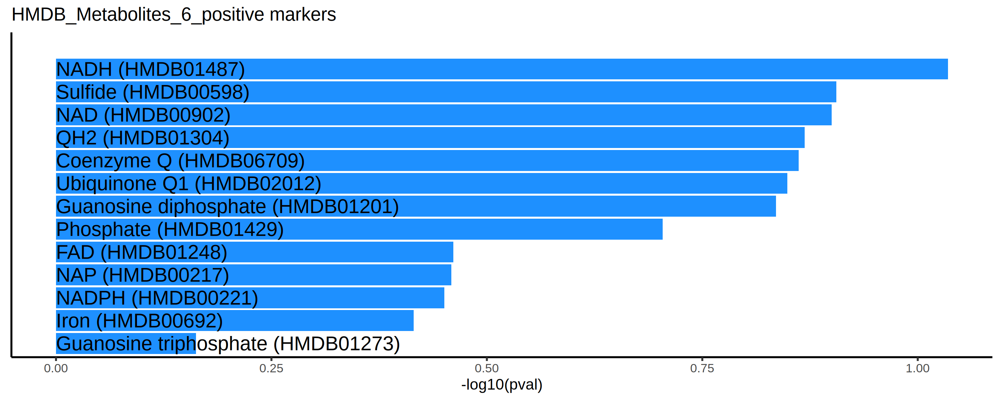

In [166]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
up_6vs1 = DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('1', '2', '3', '4', '5'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('1', '2', '3', '4', '5'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


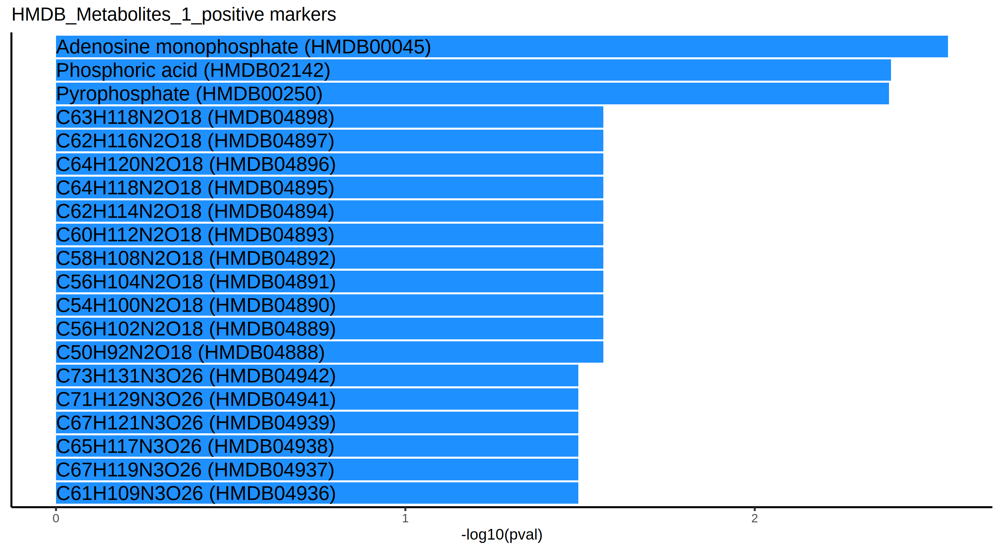

In [167]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 5.5, repr.plot.res = 300)
dn_6vs1 = DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('1', '2', '3', '4', '5'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('1', '2', '3', '4', '5'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


Warning message:
"Removed 9 rows containing missing values (`position_stack()`)."
Warning message:
"Removed 9 rows containing missing values (`geom_text()`)."


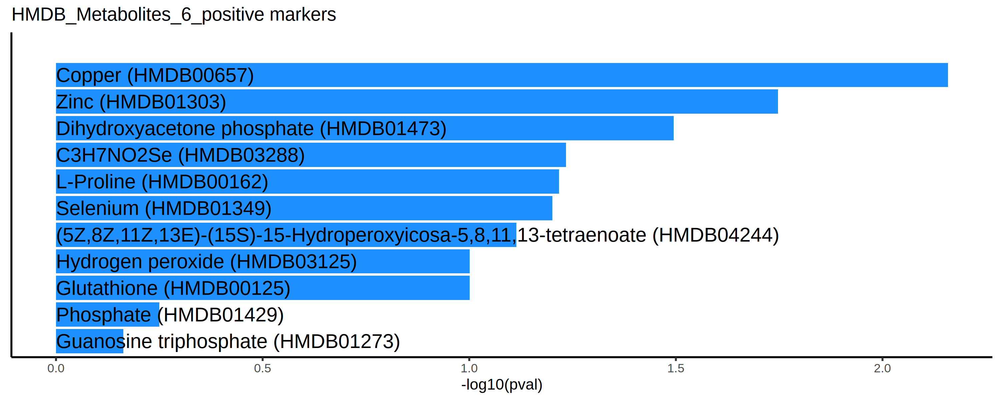

In [168]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
up_6vs7 = DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('7'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('7'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


Warning message:
"Removed 9 rows containing missing values (`position_stack()`)."
Warning message:
"Removed 9 rows containing missing values (`geom_text()`)."


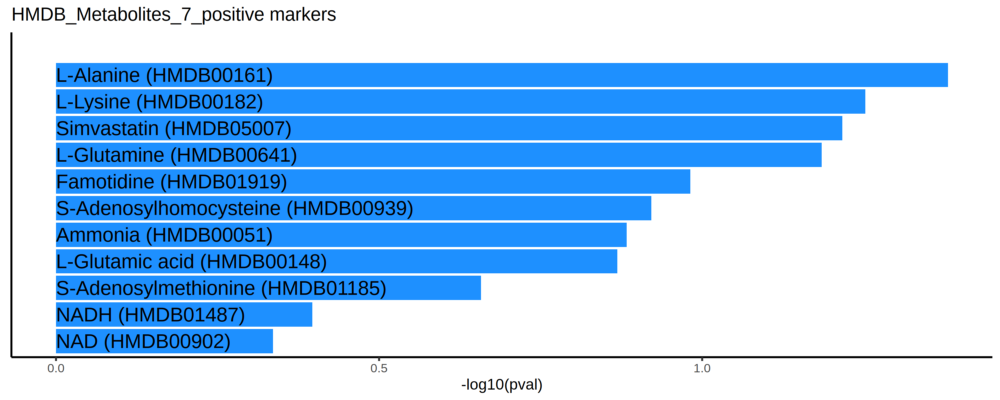

In [169]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
dn_6vs7 = DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('7'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('7'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


Warning message:
"Removed 13 rows containing missing values (`position_stack()`)."
Warning message:
"Removed 13 rows containing missing values (`geom_text()`)."


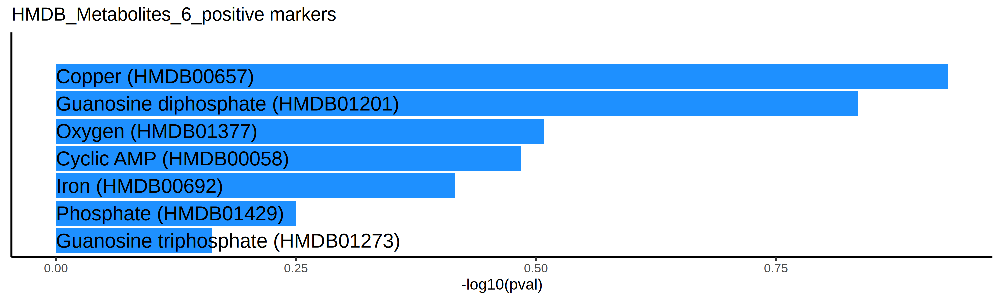

In [170]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 300)
up_6vsall = DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('1', '2', '3', '4', '5', '7'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.1 = c('6'), ident.2 = c('1', '2', '3', '4', '5', '7'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying HMDB_Metabolites... Done.
Parsing results... Done.


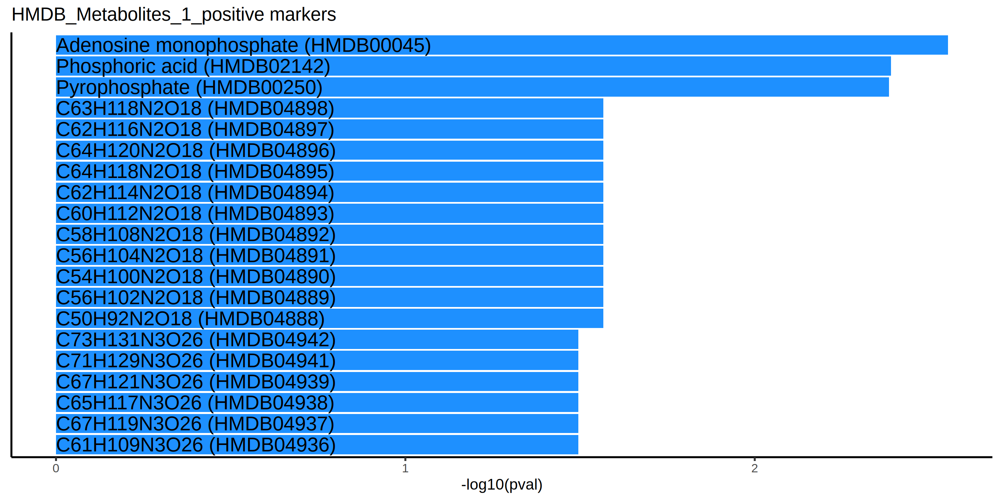

In [171]:
#PPI_Hub_Proteins GeneSigDB KEGG_2013 Reactome_2013 GO_Cellular_Component_2015 GO_Biological_Process_2015 CellMarker_2024
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
dn_6vsall = DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('1', '2', '3', '4', '5', '7'), return.gene.list = T, balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)
DEenrichRPlot(rna_seu_5, ident.2 = c('6'), ident.1 = c('1', '2', '3', '4', '5', '7'), balanced = F, enrich.database = "HMDB_Metabolites", max.genes = 50, num.pathway = 20, logfc.threshold = 1, p.val.cutoff = 0.05)

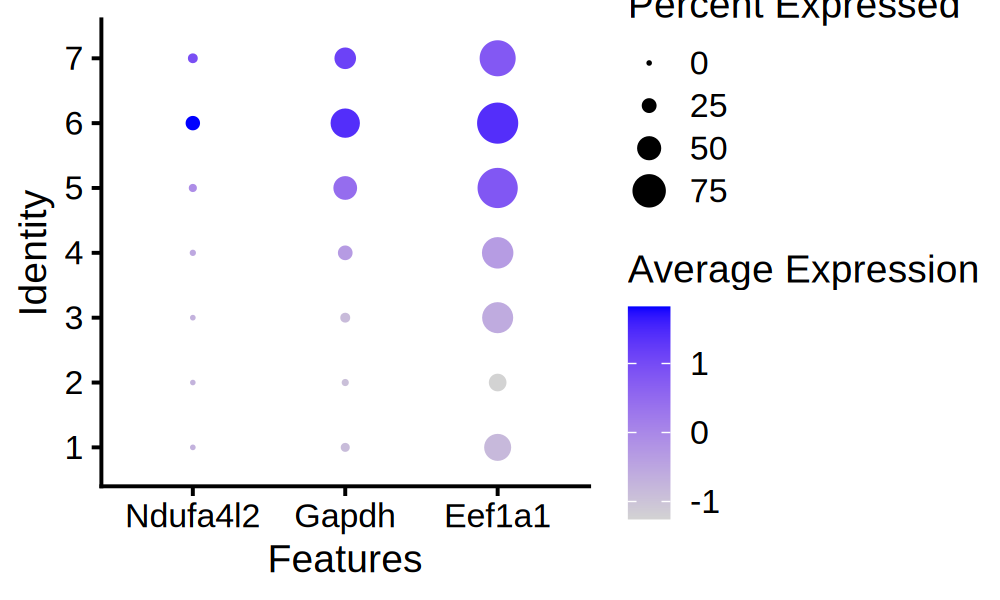

In [207]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
feat = str_to_title(c('NDUFA4L2', 'GAPDH', 'EEF1A1'))
DotPlot(rna_seu_5, features = feat)
#FeaturePlot(rna_seu_5, features = feat, label = TRUE) 


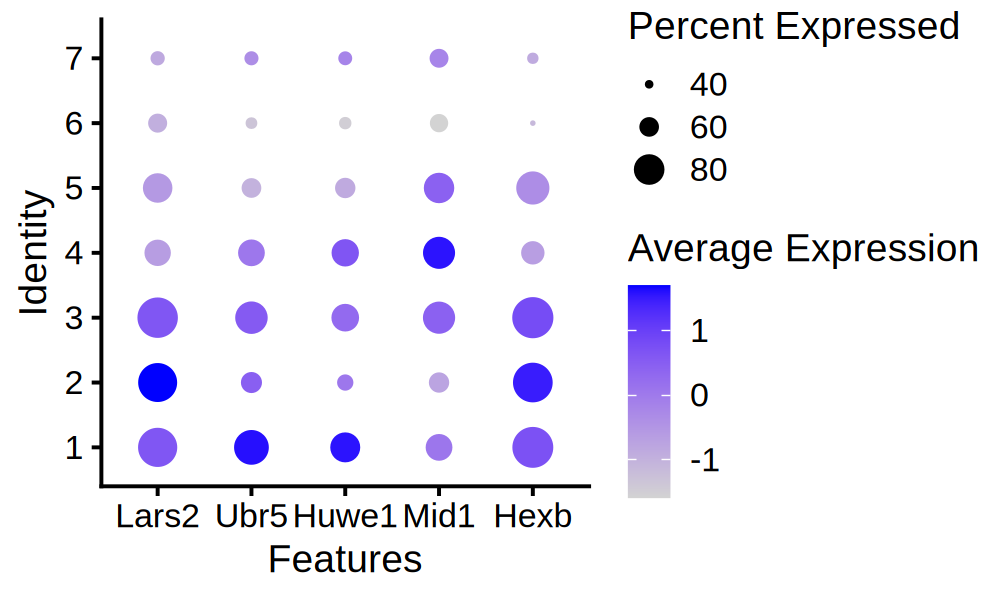

In [184]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
feat = str_to_title(c('LARS2', 'UBR5', 'HUWE1', 'MID1', 'HEXB'))
DotPlot(rna_seu_5, features = feat)
#FeaturePlot(rna_seu_5, features = feat, label = TRUE) 
